#Steps for Project:
1) setup environment: Use Movenet/Tensorflow to read videos off a training dataset



2) Load in Landmarks and train on dataset
- load in poser landmakrs + pose tracking
- create train and test set
- connect landmarks together with vertical lines
=

3) run pose classification model to classify pose
- this will be base model, will be able to predict later on

3) AI use
- process video with mediapipe
- frame clustering and centroid frame selection
- set up sklearn adn kmeans
- run kmean clustering and compare input vs pro video key centroid frames
- Show the image pairs to highlight the differences
(Optional) show the detailed scores and recommendations
- Build a Server Input: 2 videos (Front View), output: the highlighted differences on the results


ALSO YOU CAN TRACK THE RACKET HEAD

Part 1: use movenet and tensorflow to run classification on pro videos

Part 2: train pose classification model that takes landmarks and predicts tennis pose/stroke -> will look at pose and predict with type of shot(class) theyre doing

Part 3: compare input with student video to coach video (ideally would give you value and how far the student video is compared to model)
- you can build an AI algorithm (if one isn't already made) to try and compare and relate the 2 of them
-

How to turn the videos to photos to let for processing:

1) import os and a video reading library,

2) make a function where you can give a folder directory and take all videos and put it into

3) set up a directory and set it up for python to create a new directory while it runs thru
(ie. def(video_directory, shot_form))

4) use cv2 to read videos, get frame rate of video or time , and cut images based on frame rate or time --> get function to only take a certain amount of images for each image, regardless of frame rate or length



In [ ]:
import tensorflow as tf
print(tf.__version__)

2.12.0


Django web integration attempt

# Download dependencies + libraries for CompVision

In [ ]:
!pip install -q opencv-python

In [ ]:
import csv
import cv2
import itertools
import numpy as np
import pandas as pd
import os
import sys
import tempfile
import tqdm

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

Code to run pose estimation using MoveNet

Functions to run pose estimation with MoveNet


In [ ]:
# Download model from TF Hub and check out inference code from GitHub
!wget -q -O movenet_thunder.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/float16/4?lite-format=tflite
!git clone https://github.com/tensorflow/examples.git
pose_sample_rpi_path = os.path.join(os.getcwd(), 'examples/lite/examples/pose_estimation/raspberry_pi')
sys.path.append(pose_sample_rpi_path)

# Load MoveNet Thunder model
import utils
from data import BodyPart
from ml import Movenet
movenet = Movenet('movenet_thunder')

# Define function to run pose estimation using MoveNet Thunder.
# You'll apply MoveNet's cropping algorithm and run inference multiple times on
# the input image to improve pose estimation accuracy.
def detect(input_tensor, inference_count=3):
  """Runs detection on an input image.

  Args:
    input_tensor: A [height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.
    inference_count: Number of times the model should run repeatly on the
      same input image to improve detection accuracy.

  Returns:
    A Person entity detected by the MoveNet.SinglePose.
  """
  image_height, image_width, channel = input_tensor.shape

  # Detect pose using the full input image
  movenet.detect(input_tensor.numpy(), reset_crop_region=True)

  # Repeatedly using previous detection result to identify the region of
  # interest and only croping that region to improve detection accuracy
  for _ in range(inference_count - 1):
    person = movenet.detect(input_tensor.numpy(),
                            reset_crop_region=False)

  return person

Cloning into 'examples'...
remote: Enumerating objects: 23600, done.
remote: Counting objects: 100% (560/560), done.
remote: Compressing objects: 100% (336/336), done.
remote: Total 23600 (delta 164), reused 509 (delta 144), pack-reused 23040
Receiving objects: 100% (23600/23600), 44.09 MiB | 20.66 MiB/s, done.
Resolving deltas: 100% (12821/12821), done.


In [ ]:
!pip list

Package                          Version
-------------------------------- ---------------------
absl-py                          1.4.0
aiohttp                          3.8.5
aiosignal                        1.3.1
alabaster                        0.7.13
albumentations                   1.3.1
altair                           4.2.2
annotated-types                  0.5.0
anyio                            3.7.1
appdirs                          1.4.4
argon2-cffi                      23.1.0
argon2-cffi-bindings             21.2.0
array-record                     0.4.1
arviz                            0.15.1
astropy                          5.3.2
astunparse                       1.6.3
async-timeout                    4.0.3
attrs                            23.1.0
audioread                        3.0.0
autograd                         1.6.2
Babel                            2.12.1
backcall                         0.2.0
beautifulsoup4                   4.11.2
bleach                           6.0.0


In [ ]:
!pip freeze > requirements.txt

Functions to visualize the pose estimation results.

In [ ]:
def draw_prediction_on_image(
    image, person, crop_region=None, close_figure=True,
    keep_input_size=False):
  """Draws the keypoint predictions on image.

  Args:
    image: An numpy array with shape [height, width, channel] representing the
      pixel values of the input image.
    person: A person entity returned from the MoveNet.SinglePose model.
    close_figure: Whether to close the plt figure after the function returns.
    keep_input_size: Whether to keep the size of the input image.

  Returns:
    An numpy array with shape [out_height, out_width, channel] representing the
    image overlaid with keypoint predictions.
  """
  # Draw the detection result on top of the image.
  image_np = utils.visualize(image, [person])

  # Plot the image with detection results.
  height, width, channel = image.shape
  aspect_ratio = float(width) / height
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  im = ax.imshow(image_np)

  if close_figure:
    plt.close(fig)

  if not keep_input_size:
    image_np = utils.keep_aspect_ratio_resizer(image_np, (512, 512))

  return image_np

Code to load the images, detect pose landmarks and save them into a CSV file

In [ ]:
class MoveNetPreprocessor(object):
  """Helper class to preprocess pose sample images for classification."""

  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_path):
    """Creates a preprocessor to detection pose from images and save as CSV.

    Args:
      images_in_folder: Path to the folder with the input images. It should
        follow this structure:
        yoga_poses
        |__ downdog
            |______ 00000128.jpg
            |______ 00000181.bmp
            |______ ...
        |__ goddess
            |______ 00000243.jpg
            |______ 00000306.jpg
            |______ ...
        ...
      images_out_folder: Path to write the images overlay with detected
        landmarks. These images are useful when you need to debug accuracy
        issues.
      csvs_out_path: Path to write the CSV containing the detected landmark
        coordinates and label of each image that can be used to train a pose
        classification model.
    """
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_path = csvs_out_path
    self._messages = []

    # Create a temp dir to store the pose CSVs per class
    self._csvs_out_folder_per_class = tempfile.mkdtemp()

    # Get list of pose classes and print image statistics
    self._pose_class_names = sorted(
        [n for n in os.listdir(self._images_in_folder) if not n.startswith('.')]
        )

  def process(self, per_pose_class_limit=None, detection_threshold=0.1):
    """Preprocesses images in the given folder.
    Args:
      per_pose_class_limit: Number of images to load. As preprocessing usually
        takes time, this parameter can be specified to make the reduce of the
        dataset for testing.
      detection_threshold: Only keep images with all landmark confidence score
        above this threshold.
    """
    # Loop through the classes and preprocess its images
    for pose_class_name in self._pose_class_names:
      print('Preprocessing', pose_class_name, file=sys.stderr)

      # Paths for the pose class.
      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  pose_class_name + '.csv')
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)

      # Detect landmarks in each image and write it to a CSV file
      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file,
                                    delimiter=',',
                                    quoting=csv.QUOTE_MINIMAL)
        # Get list of images
        image_names = sorted(
            [n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        valid_image_count = 0

        # Detect pose landmarks from each image
        for image_name in tqdm.tqdm(image_names):
          image_path = os.path.join(images_in_folder, image_name)

          try:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
          except:
            self._messages.append('Skipped ' + image_path + '. Invalid image.')
            continue
          else:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
            image_height, image_width, channel = image.shape

          # Skip images that isn't RGB because Movenet requires RGB images
          if channel != 3:
            self._messages.append('Skipped ' + image_path +
                                  '. Image isn\'t in RGB format.')
            continue
          person = detect(image)

          # Save landmarks if all landmarks were detected
          min_landmark_score = min(
              [keypoint.score for keypoint in person.keypoints])
          should_keep_image = min_landmark_score >= detection_threshold
          if not should_keep_image:
            self._messages.append('Skipped ' + image_path +
                                  '. No pose was confidentlly detected.')
            continue

          valid_image_count += 1

          # Draw the prediction result on top of the image for debugging later
          output_overlay = draw_prediction_on_image(
              image.numpy().astype(np.uint8), person,
              close_figure=True, keep_input_size=True)

          # Write detection result into an image file
          output_frame = cv2.cvtColor(output_overlay, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)

          # Get landmarks and scale it to the same size as the input image
          pose_landmarks = np.array(
              [[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
                for keypoint in person.keypoints],
              dtype=np.float32)

          # Write the landmark coordinates to its per-class CSV file
          coordinates = pose_landmarks.flatten().astype(np.str).tolist()
          csv_out_writer.writerow([image_name] + coordinates)

        if not valid_image_count:
          raise RuntimeError(
              'No valid images found for the "{}" class.'
              .format(pose_class_name))

    # Print the error message collected during preprocessing.
    print('\n'.join(self._messages))

    # Combine all per-class CSVs into a single output file
    all_landmarks_df = self._all_landmarks_as_dataframe()
    all_landmarks_df.to_csv(self._csvs_out_path, index=False)

  def class_names(self):
    """List of classes found in the training dataset."""
    return self._pose_class_names

  def _all_landmarks_as_dataframe(self):
    """Merge all per-class CSVs into a single dataframe."""
    total_df = None
    for class_index, class_name in enumerate(self._pose_class_names):
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  class_name + '.csv')
      per_class_df = pd.read_csv(csv_out_path, header=None)

      # Add the labels
      per_class_df['class_no'] = [class_index]*len(per_class_df)
      per_class_df['class_name'] = [class_name]*len(per_class_df)

      # Append the folder name to the filename column (first column)
      per_class_df[per_class_df.columns[0]] = (os.path.join(class_name, '')
        + per_class_df[per_class_df.columns[0]].astype(str))

      if total_df is None:
        # For the first class, assign its data to the total dataframe
        total_df = per_class_df
      else:
        # Concatenate each class's data into the total dataframe
        total_df = pd.concat([total_df, per_class_df], axis=0)

    list_name = [[bodypart.name + '_x', bodypart.name + '_y',
                  bodypart.name + '_score'] for bodypart in BodyPart]
    header_name = []
    for columns_name in list_name:
      header_name += columns_name
    header_name = ['file_name'] + header_name
    header_map = {total_df.columns[i]: header_name[i]
                  for i in range(len(header_name))}

    total_df.rename(header_map, axis=1, inplace=True)

    return total_df

(Optional) Code snippet to try out the Movenet pose estimation logic

--2023-08-14 18:45:04--  https://cdn.pixabay.com/photo/2017/03/03/17/30/yoga-2114512_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.14.16, 104.18.15.16, 2606:4700::6812:f10, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.14.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29024 (28K) [binary/octet-stream]
Saving to: ‘/tmp/image.jpeg’

/tmp/image.jpeg     100%[===================>]  28.34K  --.-KB/s    in 0s      

2023-08-14 18:45:05 (84.9 MB/s) - ‘/tmp/image.jpeg’ saved [29024/29024]



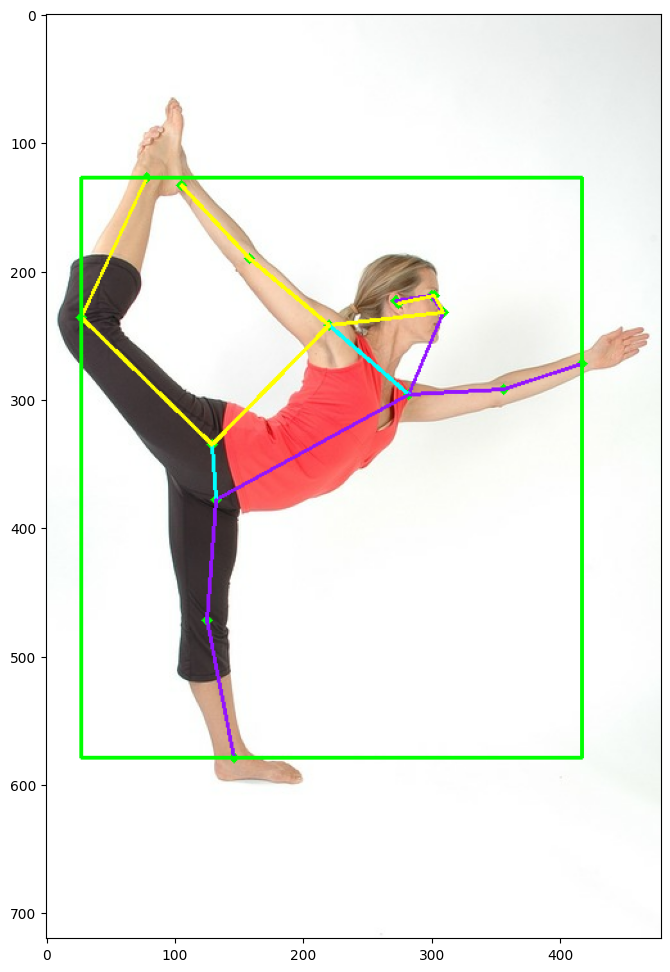

In [ ]:
test_image_url = "https://cdn.pixabay.com/photo/2017/03/03/17/30/yoga-2114512_960_720.jpg"
!wget -O /tmp/image.jpeg {test_image_url}

if len(test_image_url):
  image = tf.io.read_file('/tmp/image.jpeg')
  image = tf.io.decode_jpeg(image)
  person = detect(image)
  _ = draw_prediction_on_image(image.numpy(), person, crop_region=None,
                               close_figure=False, keep_input_size=True)

The method of training: have a folder and train and folder for test, in each folder have seperate folders for each shot in tennis: forehand, backhand, serve, etc

- After that: trian model on those datasets (tensorflow will automatically put those seperate folders into different classes

Make sure to get different angles of players hitting the forehand.

# Preprocess image dataset: tennis images


- the **input** for our pose classifier is the **output** landmarks from the MoveNet model

- we need to generate our training dataset by running labeled images through MoveNet and then capturing all the landmark data and ground truth labels into a CSV file.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
#importing for video
import os
import cv2

Mounted at /content/drive


In [ ]:
#steps to upload dataset
is_skip_step_1 = False

use_custom_dataset = True

dataset_is_split = True

Rest of code block to open and use the dataset

In [ ]:
if use_custom_dataset:
  # ATTENTION:
  # You must edit these two lines to match your archive and images folder name:
  # !tar -xf YOUR_DATASET_ARCHIVE_NAME.tar
  #!unzip -q Tennis_Poses.zip
  dataset_in = '/content/drive/MyDrive/tennis_project/Processed_Img'

  # You can leave the rest alone:
  if not os.path.isdir(dataset_in):
    raise Exception("dataset_in is not a valid directory")
  if dataset_is_split:
    IMAGES_ROOT = dataset_in
  else:
    dataset_out = 'split_' + dataset_in

    train_test_split(dataset_in, dataset_out, test_size=0.2)
    IMAGES_ROOT = dataset_out


In [ ]:
#function for CV2
import cv2
#vidcap = cv2.VideoCapture('/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/djok.mov')
def getFrame(sec, filepath):
    vidcap.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
    hasFrames,image = vidcap.read()
    if hasFrames:
        cv2.imwrite(filepath + "image"+str(count)+".jpg", image)     # save frame as JPG file
    return hasFrames


Code for turning train videos into images for dataset

In [ ]:
#get all classes name, list of strings of all files in train video
all_classes_name = os.listdir('/content/drive/MyDrive/tennis_project/Train_Video')


#length of set
length_of_set = len(all_classes_name)


#set up cv2 to read video
cam = cv2.VideoCapture()

#iterate through the entire set
for index in range(length_of_set):
  #getting specific name of the pose from index
  #each time outer loop runs, you get a new subfolder, and new list of videos in subfolder
  specific_pose_name = all_classes_name[index]
  print(specific_pose_name)

  #get video list of the all the files present in one directory
  #creating list of paths
  video_files_name_list = os.listdir(f'/content/drive/MyDrive/tennis_project/Train_Video/{specific_pose_name}')
  length_of_dir = len(video_files_name_list)
  print(video_files_name_list)

  for counter in range(length_of_dir):
    #same thing but in that subfolder
    #get the length of all the videos in that list
    #name of video inside subfolder
    specified_pose_video = video_files_name_list[counter]
    print(specified_pose_video)

  #get videos of each specific file, a string that points to the exact video to do processing
    video_in_file_list = f'/content/drive/MyDrive/tennis_project/Train_Video/{specific_pose_name}/{specified_pose_video}'
    print(video_in_file_list)


    new_file = f'/content/drive/MyDrive/tennis_project/Processed_Img/train/{specific_pose_name}/{specified_pose_video}'

    #CV2 processing, takes each video and processes it
    vidcap = cv2.VideoCapture(video_in_file_list)
    sec = 0
    frameRate = 0.5 #//it will capture image in each 0.5 second
    count=1
    success = getFrame(sec, new_file)
    while success:
      count = count + 1
      sec = sec + frameRate
      sec = round(sec, 2)
      success = getFrame(sec, new_file)






Good_Forehand
['djok_fore.mov', 'djok1_fore.mov', 'Murary2_for.mov', 'Murray_for.mov', 'Nishikori_for.mov', 'Sinner_for.mov']
djok_fore.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/djok_fore.mov
djok1_fore.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/djok1_fore.mov
Murary2_for.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/Murary2_for.mov
Murray_for.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/Murray_for.mov
Nishikori_for.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/Nishikori_for.mov
Sinner_for.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Forehand/Sinner_for.mov
Good_Backhand
['Screen Recording 2023-02-12 at 6.45.59 PM.mov', 'djok_back.mov', 'murray_back.mov', 'murr_back2.mov', 'sin_back2.mov', 'sin_back3.mov', 'nish_back.mov']
Screen Recording 2023-02-12 at 6.45.59 PM.mov
/content/drive/MyDrive/tennis_project/Train_Video/Good_Backhand/Screen Recording 2023-02-

Code For turning Test Videos into images for dataset

In [ ]:
#get all classes name, list of strings of all files in train video
all_classes_name = os.listdir('/content/drive/MyDrive/tennis_project/Test_Video')


#length of set
length_of_set = len(all_classes_name)


#set up cv2 to read video
cam = cv2.VideoCapture()

#iterate through the entire set
for index in range(length_of_set):
  #getting specific name of the pose from index
  #each time outer loop runs, you get a new subfolder, and new list of videos in subfolder
  specific_pose_name = all_classes_name[index]
  print(specific_pose_name)

  #get video list of the all the files present in one directory
  #creating list of paths
  video_files_name_list = os.listdir(f'/content/drive/MyDrive/tennis_project/Test_Video/{specific_pose_name}')
  length_of_dir = len(video_files_name_list)
  print(video_files_name_list)

  for counter in range(length_of_dir):
    #same thing but in that subfolder
    #get the length of all the videos in that list
    #name of video inside subfolder
    specified_pose_video = video_files_name_list[counter]
    print(specified_pose_video)

  #get videos of each specific file, a string that points to the exact video to do processing
    video_in_file_list = f'/content/drive/MyDrive/tennis_project/Test_Video/{specific_pose_name}/{specified_pose_video}'
    print(video_in_file_list)


    new_file = f'/content/drive/MyDrive/tennis_project/Processed_Img/test/{specific_pose_name}/{specified_pose_video}'

    #CV2 processing, takes each video and processes it
    vidcap = cv2.VideoCapture(video_in_file_list)
    sec = 0
    frameRate = 0.5 #//it will capture image in each 0.5 second
    count=1
    success = getFrame(sec, new_file)
    while success:
      count = count + 1
      sec = sec + frameRate
      sec = round(sec, 2)
      success = getFrame(sec, new_file)






Good_Forehand
['Rudd_for.mov']
Rudd_for.mov
/content/drive/MyDrive/tennis_project/Test_Video/Good_Forehand/Rudd_for.mov


Code for turning input video into img


In [ ]:
#get all classes name, list of strings of all files in train video
all_classes_name = os.listdir('/content/drive/MyDrive/tennis_project/Input_Video')


#length of set
length_of_set = len(all_classes_name)


#set up cv2 to read video
cam = cv2.VideoCapture()


#iterate through the entire set
for index in range(length_of_set):
  #getting specific name of the pose from index
  #each time outer loop runs, you get a new subfolder, and new list of videos in subfolder
  specific_pose_name = all_classes_name[index]
  print(specific_pose_name)

  #get video list of the all the files present in one directory
  #creating list of paths
  video_files_name_list = os.listdir(f'/content/drive/MyDrive/tennis_project/Input_Video/{specific_pose_name}')
  length_of_dir = len(video_files_name_list)
  print(video_files_name_list)

  for counter in range(length_of_dir):
    #same thing but in that subfolder
    #get the length of all the videos in that list
    #name of video inside subfolder
    specified_pose_video = video_files_name_list[counter]
    print(specified_pose_video)

  #get videos of each specific file, a string that points to the exact video to do processing
    video_in_file_list = f'/content/drive/MyDrive/tennis_project/Input_Video/{specific_pose_name}/{specified_pose_video}'
    print(video_in_file_list)


    new_file = f'/content/drive/MyDrive/tennis_project/Processed_Img/input/{specific_pose_name}/{specified_pose_video}'

    #CV2 processing, takes each video and processes it
    vidcap = cv2.VideoCapture(video_in_file_list)
    sec = 0
    frameRate = 0.5 #//it will capture image in each 0.5 second
    count=1
    success = getFrame(sec, new_file)
    while success:
      print("ad")
      count = count + 1
      sec = sec + frameRate
      sec = round(sec, 2)
      success = getFrame(sec, new_file)






input_forehand
['med_fore.mov']
med_fore.mov
/content/drive/MyDrive/tennis_project/Input_Video/input_forehand/med_fore.mov
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad
ad


Preprocess the Train Dataset

In [ ]:
if not is_skip_step_1:
  images_in_train_folder = os.path.join(IMAGES_ROOT, 'train')
  images_out_train_folder = 'poses_images_out_train'
  csvs_out_train_path = 'train_data.csv'

  preprocessor = MoveNetPreprocessor(
      images_in_folder=images_in_train_folder,
      images_out_folder=images_out_train_folder,
      csvs_out_path=csvs_out_train_path,
  )

  preprocessor.process(per_pose_class_limit=None)

Preprocessing Good_Backhand
  0%|          | 0/164 [00:00<?, ?it/s]<ipython-input-6-ea284278d629>:126: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  coordinates = pose_landmarks.flatten().astype(np.str).tolist()
100%|██████████| 164/164 [09:46<00:00,  3.58s/it]
Preprocessing Good_BackhandSlice
100%|██████████| 81/81 [04:50<00:00,  3.59s/it]
Preprocessing Good_Forehand
100%|██████████| 198/198 [11:36<00:00,  3.52s/it]
Preprocessing Good_Serve
100%|██████████| 182/182 [10:56<00:00,  3.61s/it]

Skipped /content/drive/MyDrive/tennis_project/Processed_Img/train/Good_Backhand/Screen Recording 2023-02-12 at 6.45.59 PM.movimage27.jpg. No pose was confidentlly detected.
Skipped /content/drive/MyDrive/tennis_project/Processed_Img/train/Good_Backhand/Screen Recording 2023-02-12 at 6.45.59 PM.movimage28.jpg. No pose was confidentlly detected.
Skipped /content/drive/MyDrive/tennis_project/Processed_Img/train/Good_Backhand/Screen Recording 2023-02-12 at 6.45.59 PM.movimage30.jpg. No pose was confidentlly detected.
Skipped /content/drive/MyDrive/tennis_project/Processed_Img/train/Good_Backhand/Screen Recording 2023-02-12 at 6.45.59 PM.movimage31.jpg. No pose was confidentlly detected.
Skipped /content/drive/MyDrive/tennis_project/Processed_Img/train/Good_Backhand/nish_back.movimage23.jpg. No pose was confidentlly detected.
Skipped /content/drive/MyDrive/tennis_project/Processed_Img/train/Good_Backhand/sin_back2.movimage5.jpg. No pose was confidentlly detected.
Skipped /content/drive/MyDr

Preprocess the Test Dataset

In [ ]:
if not is_skip_step_1:
  images_in_test_folder = os.path.join(IMAGES_ROOT, 'test')
  images_out_test_folder = 'poses_images_out_test'
  csvs_out_test_path = 'test_data.csv'

  preprocessor = MoveNetPreprocessor(
      images_in_folder=images_in_test_folder,
      images_out_folder=images_out_test_folder,
      csvs_out_path=csvs_out_test_path,
  )

  preprocessor.process(per_pose_class_limit=None)


Preprocessing Good_Forehand
  0%|          | 0/26 [00:00<?, ?it/s]<ipython-input-6-ea284278d629>:126: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  coordinates = pose_landmarks.flatten().astype(np.str).tolist()
100%|██████████| 26/26 [01:32<00:00,  3.55s/it]

Preprocess input data


In [ ]:
#make new file for input and then make new function that takes in video to make into img
if not is_skip_step_1:
  images_in_input_folder = os.path.join(IMAGES_ROOT, 'input')
  images_out_input_folder = 'poses_out'
  csvs_out_input_path = 'input_vid.csv'

  preprocessor = MoveNetPreprocessor(
      images_in_folder=images_in_input_folder, #img
      images_out_folder=images_out_input_folder, #img + poses
      csvs_out_path=csvs_out_input_path, #img + pose data
  )

  preprocessor.process(per_pose_class_limit=None)



Preprocessing input_forehand
  0%|          | 0/21 [00:00<?, ?it/s]<ipython-input-6-ea284278d629>:126: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  coordinates = pose_landmarks.flatten().astype(np.str).tolist()
100%|██████████| 21/21 [01:14<00:00,  3.55s/it]

Skipped /content/drive/MyDrive/tennis_project/Processed_Img/input/input_forehand/med_fore.movimage18.jpg. No pose was confidentlly detected.


# Train a pose classification model that takes the landmark coordinates as input, and output the predicted labels

build model that takes in landmark coordinates and output the pose class that person in input image performs

there are 2 submodels for this model

- submodel one calculates a pose embedding (a.k.a feature vector) from the detected landmark coordinates.

- submodel 2 feeds pose embedding through several Dense layer to predict the pose class.

Then train model based on preprocessed dataset

# Load preprocessed CSVs into train and test set

In [ ]:
def load_pose_landmarks(csv_path):
  """Loads a CSV created by MoveNetPreprocessor.

  Returns:
    X: Detected landmark coordinates and scores of shape (N, 17 * 3)
    y: Ground truth labels of shape (N, label_count)
    classes: The list of all class names found in the dataset
    dataframe: The CSV loaded as a Pandas dataframe features (X) and ground
      truth labels (y) to use later to train a pose classification model.
  """

  # Load the CSV file
  dataframe = pd.read_csv(csv_path)
  df_to_process = dataframe.copy()

  # Drop the file_name columns as you don't need it during training.
  df_to_process.drop(columns=['file_name'], inplace=True)

  # Extract the list of class names
  classes = df_to_process.pop('class_name').unique()

  # Extract the labels
  y = df_to_process.pop('class_no')

  # Convert the input features and labels into the correct format for training.
  X = df_to_process.astype('float64')
  y = keras.utils.to_categorical(y)

  return X, y, classes, dataframe

# Load and split the original TRAIN dataset into TRAIN (85% of the data) and VALIDATE (the remaining 15%).

In [ ]:
# Load the train data
X, y, class_names, _ = load_pose_landmarks(csvs_out_train_path)

# Split training data (X, y) into (X_train, y_train) and (X_val, y_val)
X_train, X_val, y_train, y_val = train_test_split(X, y,
                                                  test_size=0.15)

In [ ]:
# Load the test data
X_test, y_test, _, df_test = load_pose_landmarks(csvs_out_test_path)

In [ ]:
#Load input data
X_input, y_input, _, df_input = load_pose_landmarks(csvs_out_input_path)

# Define functions which convert the pose landmarks to a pose embedding (a.k.a. feature vector) for pose classification


Next, convert the landmark coordinates to a feature vector by:

1) Moving the pose center to the origin.

2) Scaling the pose so that the pose size becomes 1

3) Flattening these coordinates into a feature vector

Then use this feature vector to train a neural-network based pose classifier.

In [ ]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
  """Calculates the center point of the two given landmarks."""

  left = tf.gather(landmarks, left_bodypart.value, axis=1)
  right = tf.gather(landmarks, right_bodypart.value, axis=1)
  center = left * 0.5 + right * 0.5
  return center


def get_pose_size(landmarks, torso_size_multiplier=2.5):
  """Calculates pose size.

  It is the maximum of two values:
    * Torso size multiplied by `torso_size_multiplier`
    * Maximum distance from pose center to any pose landmark
  """
  # Hips center
  hips_center = get_center_point(landmarks, BodyPart.LEFT_HIP,
                                 BodyPart.RIGHT_HIP)

  # Shoulders center
  shoulders_center = get_center_point(landmarks, BodyPart.LEFT_SHOULDER,
                                      BodyPart.RIGHT_SHOULDER)

  # Torso size as the minimum body size
  torso_size = tf.linalg.norm(shoulders_center - hips_center)

  # Pose center
  pose_center_new = get_center_point(landmarks, BodyPart.LEFT_HIP,
                                     BodyPart.RIGHT_HIP)
  pose_center_new = tf.expand_dims(pose_center_new, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to
  # perform substraction
  pose_center_new = tf.broadcast_to(pose_center_new,
                                    [tf.size(landmarks) // (17*2), 17, 2])

  # Dist to pose center
  d = tf.gather(landmarks - pose_center_new, 0, axis=0,
                name="dist_to_pose_center")
  # Max dist to pose center
  max_dist = tf.reduce_max(tf.linalg.norm(d, axis=0))

  # Normalize scale
  pose_size = tf.maximum(torso_size * torso_size_multiplier, max_dist)

  return pose_size


def normalize_pose_landmarks(landmarks):
  """Normalizes the landmarks translation by moving the pose center to (0,0) and
  scaling it to a constant pose size.
  """
  # Move landmarks so that the pose center becomes (0,0)
  pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP,
                                 BodyPart.RIGHT_HIP)
  pose_center = tf.expand_dims(pose_center, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to perform
  # substraction
  pose_center = tf.broadcast_to(pose_center,
                                [tf.size(landmarks) // (17*2), 17, 2])
  landmarks = landmarks - pose_center

  # Scale the landmarks to a constant pose size
  pose_size = get_pose_size(landmarks)
  landmarks /= pose_size

  return landmarks


def landmarks_to_embedding(landmarks_and_scores):
  """Converts the input landmarks into a pose embedding."""
  # Reshape the flat input into a matrix with shape=(17, 3)
  reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)

  # Normalize landmarks 2D
  landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])

  # Flatten the normalized landmark coordinates into a vector
  embedding = keras.layers.Flatten()(landmarks)

  return embedding

  #ISSUE: some of the images aren't being processed by the pose detector,
  #making it difficult for recognition, need to find better images with claerer landmarks
  #important to set up the imnages, possibly normalized or regularize them to allow for better processing
  #try to resize, reframe, or angle the image so that major landmark points can be identified, if too much work then just find new images

  # try and add some landmarks onto the tennis racket, attempt to trace them, would be better if I can also track wrist and arm
  #althought that would be a lot




# Define a Keras model for pose classification
**bold text**
> Indented block



Our Keras model takes the detected pose landmarks, then calculates the pose embedding and predicts the pose class.

In [ ]:
# Define the model
inputs = tf.keras.Input(shape=(51))
embedding = landmarks_to_embedding(inputs)

layer = keras.layers.Dense(128, activation=tf.nn.relu6)(embedding)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(64, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

model = keras.Model(inputs, outputs)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 51)]         0           []                               
                                                                                                  
 reshape (Reshape)              (None, 17, 3)        0           ['input_1[0][0]']                
                                                                                                  
 tf.__operators__.getitem (Slic  (None, 17, 2)       0           ['reshape[0][0]']                
 ingOpLambda)                                                                                     
                                                                                                  
 tf.compat.v1.gather (TFOpLambd  (None, 2)           0           ['tf.__operators__.getitem[0]

In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Add a checkpoint callback to store the checkpoint that has the highest
# validation accuracy.
checkpoint_path = "weights.best.hdf5"
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                             monitor='val_accuracy',
                             verbose=1,
                             save_best_only=True,
                             mode='max')
earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                              patience=20)

# Start training
history = model.fit(X_train, y_train,
                    epochs=200,
                    batch_size=16,
                    validation_data=(X_val, y_val),
                    callbacks=[checkpoint, earlystopping])

Epoch 1/200
32/32 [==============================] - ETA: 0s - loss: 1.3714 - accuracy: 0.3261
Epoch 1: val_accuracy improved from -inf to 0.33333, saving model to weights.best.hdf5
32/32 [==============================] - 9s 35ms/step - loss: 1.3714 - accuracy: 0.3261 - val_loss: 1.3317 - val_accuracy: 0.3333
Epoch 2/200
27/32 [========================>.....] - ETA: 0s - loss: 1.3352 - accuracy: 0.3750
Epoch 2: val_accuracy did not improve from 0.33333
32/32 [==============================] - 0s 12ms/step - loss: 1.3408 - accuracy: 0.3654 - val_loss: 1.3024 - val_accuracy: 0.3222
Epoch 3/200
32/32 [==============================] - ETA: 0s - loss: 1.3170 - accuracy: 0.3733
Epoch 3: val_accuracy improved from 0.33333 to 0.43333, saving model to weights.best.hdf5
32/32 [==============================] - 0s 14ms/step - loss: 1.3170 - accuracy: 0.3733 - val_loss: 1.2690 - val_accuracy: 0.4333
Epoch 4/200
26/32 [=======================>......] - ETA: 0s - loss: 1.2845 - accuracy: 0.4255
Ep

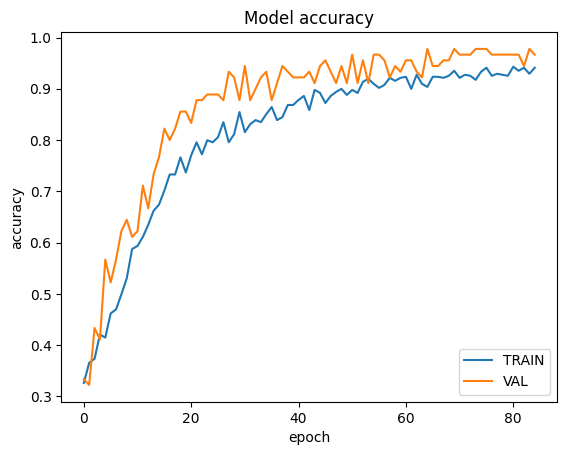

In [ ]:
# Visualize the training history to see whether you're overfitting.
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

In [ ]:
# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

1/1 [==============================] - 0s 478ms/step - loss: 14.7453 - accuracy: 0.1154


1/1 [==============================] - 0s 374ms/step
Confusion matrix, without normalization


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Classification Report:
                     precision    recall  f1-score   support

     Good_Backhand       1.00      0.12      0.21        26
Good_BackhandSlice       0.00      0.00      0.00         0
        Good_Serve       0.00      0.00      0.00         0

          accuracy                           0.12        26
         macro avg       0.33      0.04      0.07        26
      weighted avg       1.00      0.12      0.21        26

[[2.33076775e-04 2.23882403e-03 2.09239643e-05 9.97507155e-01]
 [7.64910057e-02 3.75696212e-01 3.30089754e-03 5.44511855e-01]
 [6.22884706e-02 3.77465487e-01 2.81213201e-03 5.57433903e-01]
 [2.18787678e-02 1.07982598e-01 1.87765015e-03 8.68260980e-01]
 [2.52321512e-02 8.17329213e-02 2.49171234e-03 8.90543222e-01]
 [2.92787775e-02 6.02945313e-02 1.78083871e-03 9.08645809e-01]
 [1.30768251e-02 2.98004095e-02 7.62623269e-04 9.56360161e-01]
 [2.00067554e-03 2.65512709e-02 1.10432426e-04 9.71337557e-01]
 [4.74104454e-04 1.42308891e-01 2.21297651e-05 8

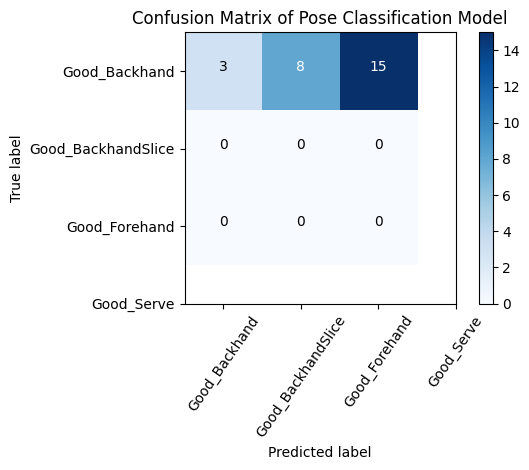

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  """Plots the confusion matrix."""
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print('Confusion matrix, without normalization')

  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=55)
  plt.yticks(tick_marks, classes)
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
              horizontalalignment="center",
              color="white" if cm[i, j] > thresh else "black")

  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.tight_layout()

# Classify pose in the TEST dataset using the trained model
y_pred = model.predict(X_test)

# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_test, axis=1)]

# Plot the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm,
                      class_names,
                      title ='Confusion Matrix of Pose Classification Model')

# Print the classification report
print('\nClassification Report:\n', classification_report(y_true_label,
                                                          y_pred_label))

print(y_pred, y_pred_label)

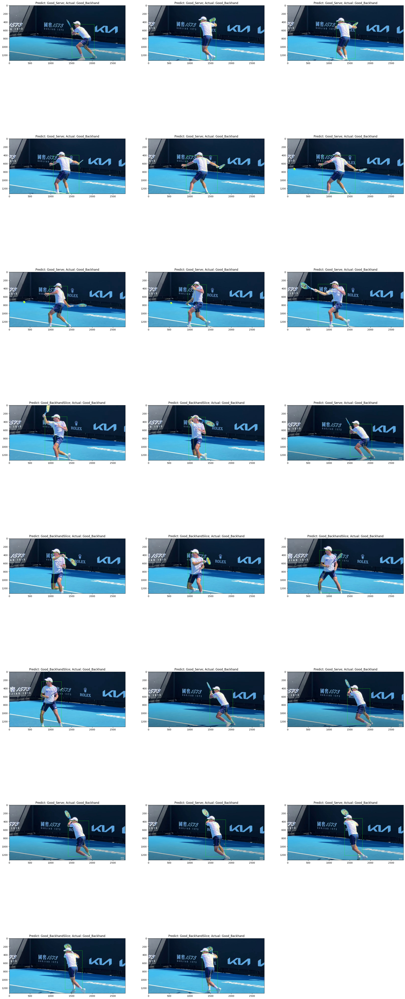

In [ ]:
if is_skip_step_1:
  raise RuntimeError('You must have run step 1 to run this cell.')

# If step 1 was skipped, skip this step.
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Extract the list of incorrectly predicted poses
false_predict = [id_in_df for id_in_df in range(len(y_test)) \
                if y_pred_label[id_in_df] != y_true_label[id_in_df]]
if len(false_predict) > MAX_NO_OF_IMAGE_TO_PLOT:
  false_predict = false_predict[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the incorrectly predicted images
row_count = len(false_predict) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(false_predict):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(images_out_test_folder,
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predict: %s; Actual: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

Input for video

In [ ]:
#prediction here, model.predict(csv)
prediction = model.predict(X_input)


# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(prediction, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_input, axis=1)]

print(prediction, y_pred_label, y_true_label)

1/1 [==============================] - 0s 49ms/step
[[1.29310042e-02 1.50904129e-03 8.78651023e-01 1.06908984e-01]
 [1.11047802e-02 2.87329972e-01 6.87842667e-01 1.37225343e-02]
 [6.95930282e-03 7.61293769e-01 1.89660162e-01 4.20867018e-02]
 [1.52740180e-02 1.15402974e-01 7.83883035e-01 8.54400396e-02]
 [1.60659570e-02 1.60603728e-02 9.44774330e-01 2.30992977e-02]
 [2.69767530e-02 1.01050688e-02 8.99709284e-01 6.32089227e-02]
 [2.53008660e-02 1.11434767e-02 7.97871590e-01 1.65684119e-01]
 [2.45403359e-03 1.38300518e-03 9.58618104e-01 3.75448912e-02]
 [2.09167181e-03 8.98588740e-04 9.72504079e-01 2.45057214e-02]
 [6.45623961e-03 1.93525164e-03 9.71453846e-01 2.01547537e-02]
 [4.17553149e-02 7.61337252e-03 6.99448347e-01 2.51182944e-01]
 [1.77635700e-02 9.09843016e-03 9.35471654e-01 3.76664475e-02]
 [5.01739793e-02 5.82285319e-03 9.18147743e-01 2.58554816e-02]
 [6.27636537e-02 1.35327028e-02 7.78500438e-01 1.45203218e-01]
 [6.13722987e-02 4.73673306e-02 7.13860214e-01 1.77400082e-01]
 [8

1/1 [==============================] - 0s 33ms/step
Confusion matrix, without normalization

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

                     precision    recall  f1-score   support

     Good_Backhand       0.00      0.00      0.00      20.0
Good_BackhandSlice       0.00      0.00      0.00       0.0
     Good_Forehand       0.00      0.00      0.00       0.0

          accuracy                           0.00      20.0
         macro avg       0.00      0.00      0.00      20.0
      weighted avg       0.00      0.00      0.00      20.0

[[1.29310042e-02 1.50904129e-03 8.78651023e-01 1.06908984e-01]
 [1.11047802e-02 2.87329972e-01 6.87842667e-01 1.37225343e-02]
 [6.95930282e-03 7.61293769e-01 1.89660162e-01 4.20867018e-02]
 [1.52740180e-02 1.15402974e-01 7.83883035e-01 8.54400396e-02]
 [1.60659570e-02 1.60603728e-02 9.44774330e-01 2.30992977e-02]
 [2.69767530e-02 1.01050688e-02 8.99709284e-01 6.32089227e-02]
 [2.53008660e-02 1.11434767e-02 7.97871590e-01 1.65684119e-01]
 [2.45403359e-03 1.38300518e-03 9.58618104e-01 3.75448912e-02]
 [2.09167181e-03 8.98588740e-04 9.72504079e-01 2.45057214e-02]
 [6.45623

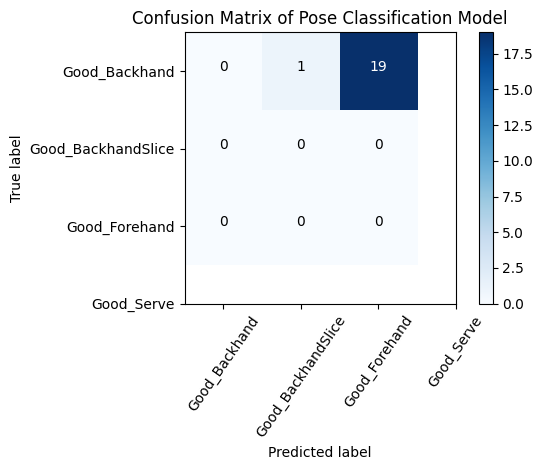

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  """Plots the confusion matrix."""
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print('Confusion matrix, without normalization')

  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=55)
  plt.yticks(tick_marks, classes)
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
              horizontalalignment="center",
              color="white" if cm[i, j] > thresh else "black")

  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.tight_layout()

# Classify pose in the TEST dataset using the trained model
y_pred = model.predict(X_input)

# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_input, axis=1)]

# Plot the confusion matrix
cm = confusion_matrix(np.argmax(y_input, axis=1), np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm,
                      class_names,
                      title ='Confusion Matrix of Pose Classification Model')

# Print the classification report
print('\nClassification Report:\n', classification_report(y_true_label,
                                                          y_pred_label))

print(y_pred, y_pred_label)

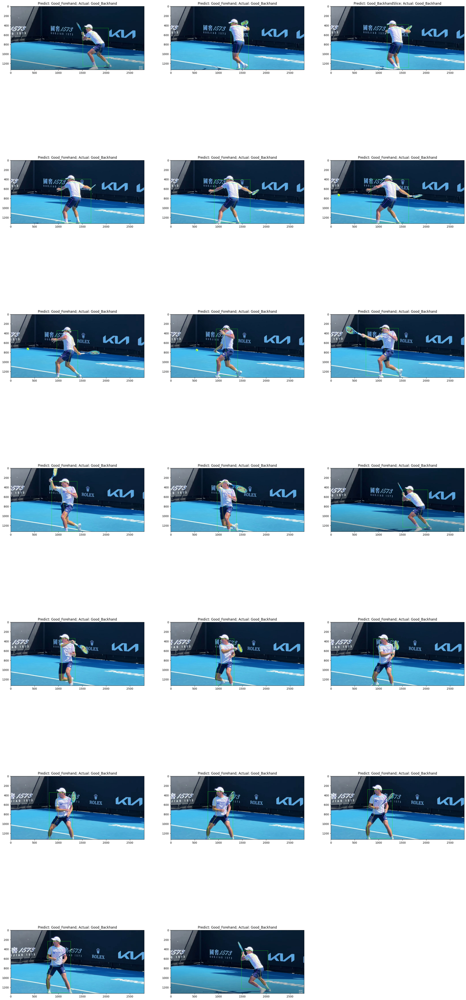

In [ ]:
if is_skip_step_1:
  raise RuntimeError('You must have run step 1 to run this cell.')

# If step 1 was skipped, skip this step.
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Extract the list of incorrectly predicted poses
false_predict = [id_in_df for id_in_df in range(len(y_input)) \
                if y_pred_label[id_in_df] != y_true_label[id_in_df]]
if len(false_predict) > MAX_NO_OF_IMAGE_TO_PLOT:
  false_predict = false_predict[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the incorrectly predicted images
row_count = len(false_predict) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(false_predict):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(images_out_test_folder,
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predict: %s; Actual: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# Saving the model for Future Inferences

model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model.h5")

NameError: ignored

In [15]:
!pip install flask --quiet
!pip install flask-ngrok --quiet
print("Completed!")

/bin/bash: line 1: ngrok: command not found


In [ ]:
# install ngrok linux version using the following command or you can get the
# latest version from its official website- https://dashboard.ngrok.com/get-started/setup

!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.tgz

In [4]:
# extract the downloaded file using the following command

!tar -xvf /content/ngrok-stable-linux-amd64.tgz

In [ ]:
# paste your AuthToken here and execute this command

!./ngrok authtoken 2UaqN46HavK9vGeAt3iCN3eknbs_3dPMtbR1WW1JrWJFdyLeG

In [ ]:
# import Flask from flask module
from flask import Flask, render_template, request, session
import os
from werkzeug.utils import secure_filename
# import run_with_ngrok from flask_ngrok to run the app using ngrok
from flask_ngrok import run_with_ngrok

app = Flask(__name__) #app name
app._static_folder = '/content/staticFiles'
#bootstrap = Bootstrap(app)
run_with_ngrok(app)

@app.route("/")
def home():
    return render_template('/template/index.html')


if __name__ == "__main__":
    app.run()

NameError: ignored